# [**LCA net**](https://arxiv.org/pdf/2008.10325v1.pdf) 

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import random
from PIL import Image
import time
import datetime

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mean_squared_error
from tensorflow.keras.optimizers import Adam

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Preprocessing and loading of data

In [11]:
#ls drive/MyDrive/reside/archive/clear_images drive/MyDrive/reside/archive/haze  

In [12]:
# function to load the image in the form of tensors.

def load_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, size = (512,512), antialias = True)
    img = img / 255.0
    return img

In [13]:
# function to get the path of individual image.

def data_path(orig_img_path, hazy_img_path):
    
    train_img = []
    val_img = []
    
    orig_img = glob.glob(orig_img_path + '/*.jpg')
    n = len(orig_img)
    random.shuffle(orig_img)
    train_keys = orig_img[:int(0.9*n)]        #90% data for train, 10% for test
    val_keys = orig_img[int(0.9*n):]
    
    split_dict = {}
    for key in train_keys:
        split_dict[key] = 'train'
    for key in val_keys:
        split_dict[key] = 'val'
        
    hazy_img = glob.glob(hazy_img_path + '/*.jpg')
    for img in hazy_img:
        img_name = img.split('/')[-1]
        orig_path = orig_img_path + '/' + img_name.split('_')[0] + '.jpg'
        if (split_dict[orig_path] == 'train'):
            train_img.append([img, orig_path])
        else:
            val_img.append([img, orig_path])
            
    return train_img, val_img

In [14]:
# function to load tensor image data in batches.

def dataloader(train_data, val_data, batch_size):
    
    train_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in train_data]).map(lambda x: load_image(x))
    train_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in train_data]).map(lambda x: load_image(x))
    train = tf.data.Dataset.zip((train_data_haze, train_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    val_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in val_data]).map(lambda x: load_image(x))
    val_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in val_data]).map(lambda x: load_image(x))
    val = tf.data.Dataset.zip((val_data_haze, val_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    return train, val

In [15]:
# function to display output.

def display_img(model, hazy_img, orig_img):
    
    dehazed_img = model(hazy_img, training = True)
    plt.figure(figsize = (15,15))
    
    display_list = [hazy_img[0], orig_img[0], dehazed_img[0]]
    title = ['Hazy Image', 'Ground Truth', 'Dehazed Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
        
    plt.show()

# Network Function

In [21]:
def gman_net():
    
    inputs = tf.keras.Input(shape = [512,512, 3])     # height, width of input image changed because of error in output
    conv = Conv2D(filters = 50, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu',)(inputs)
    poolLayer=AveragePooling2D(pool_size=(2,2))(conv)
    conv1 = Conv2D(filters = 50, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu')(poolLayer)
    poolLayer=AveragePooling2D(pool_size=(2,2))(conv1)  
    #flat=Flatten()(poolLayer)
    dens1=Dense(10,activation='relu')(poolLayer)
    dens2=Dense(10,activation='relu')(dens1)
    deconv1=Conv2DTranspose(50,kernel_size=(3,3),padding='same',activation='relu')(dens2)
    upsamp1=UpSampling2D(size=(2,2))(deconv1)
    deconv2=Conv2DTranspose(50,kernel_size=(3,3),padding='same',activation='relu')(upsamp1)
    upsamp2=UpSampling2D(size=(2,2))(deconv2)
    deconv3=Conv2DTranspose(3,kernel_size=(3,3),padding='same',activation='linear')(upsamp2)
    output = deconv3
    
    return Model(inputs = inputs, outputs = output)

In [22]:
model=gman_net()
model.build([512,512,3])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 512, 512, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 512, 512, 50)      1400      
_________________________________________________________________
average_pooling2d (AveragePo (None, 256, 256, 50)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 50)      22550     
_________________________________________________________________
average_pooling2d_1 (Average (None, 128, 128, 50)      0         
_________________________________________________________________
dense (Dense)                (None, 128, 128, 10)      510       
_________________________________________________________________
dense_1 (Dense)              (None, 128, 128, 10)      110   

In [26]:
# Hyperparameters
epochs = 40
batch_size = 8
k_init = tf.keras.initializers.random_normal(stddev=0.008, seed = 101)      
regularizer = tf.keras.regularizers.L2(1e-4)
b_init = tf.constant_initializer()

train_data, val_data = data_path(orig_img_path = './drive/MyDrive/reside/archive/clear_images', hazy_img_path = './drive/MyDrive/reside/archive/haze')
train, val = dataloader(train_data, val_data, batch_size)

optimizer = Adam(learning_rate = 1e-4)
net = gman_net()

train_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "train loss")
val_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "val loss")

In [27]:
def train_model(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer):
    
    for epoch in range(epochs):
        
        print("\nStart of epoch %d" % (epoch,), end=' ')
        start_time_epoch = time.time()
        start_time_step = time.time()
        
        # training loop
        
        for step, (train_batch_haze, train_batch_orig) in enumerate(train):

            with tf.GradientTape() as tape:

                train_logits = net(train_batch_haze, training = True)
                loss = mean_squared_error(train_batch_orig, train_logits)

            grads = tape.gradient(loss, net.trainable_weights)
            optimizer.apply_gradients(zip(grads, net.trainable_weights))

            train_loss_tracker.update_state(train_batch_orig, train_logits)
            if step == 0:
                print('[', end='')
            if step % 64 == 0:
                print('=', end='')
        
        print(']', end='')
        print('  -  ', end='')
        print('Training Loss: %.4f' % (train_loss_tracker.result()), end='')
        
        # validation loop
        
        for step, (val_batch_haze, val_batch_orig) in enumerate(val):
            val_logits = net(val_batch_haze, training = False)
            val_loss_tracker.update_state(val_batch_orig, val_logits)
            
            if step % 32 ==0:
                display_img(net, val_batch_haze, val_batch_orig)
        
        print('  -  ', end='')
        print('Validation Loss: %.4f' % (val_loss_tracker.result()), end='')
        print('  -  ', end=' ')
        print("Time taken: %.2fs" % (time.time() - start_time_epoch))
        
        net.save('trained_model')           # save the model(variables, weights, etc)
        train_loss_tracker.reset_states()
        val_loss_tracker.reset_states()


Start of epoch 0 [==]  -  Training Loss: 0.0994

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


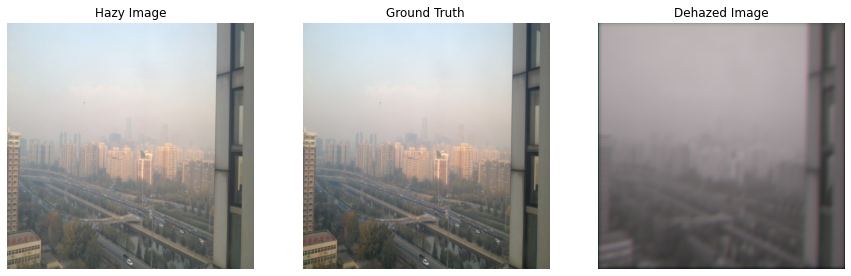

  -  Validation Loss: 0.0251  -   Time taken: 37.93s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 1 [==]  -  Training Loss: 0.0262

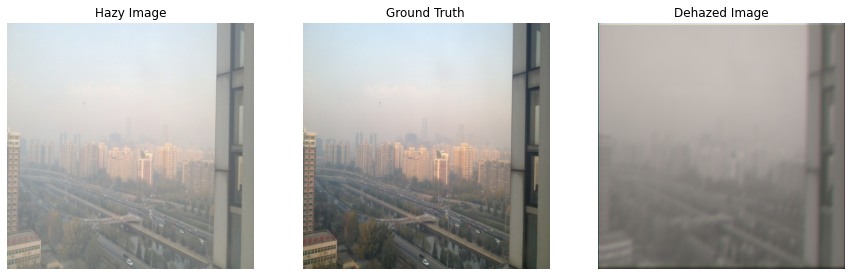

  -  Validation Loss: 0.0213  -   Time taken: 37.72s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 2 [==]  -  Training Loss: 0.0217

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


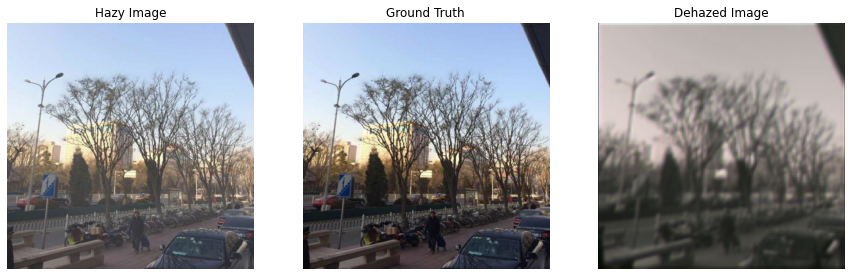

  -  Validation Loss: 0.0156  -   Time taken: 37.81s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 3 [==]  -  Training Loss: 0.0155

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


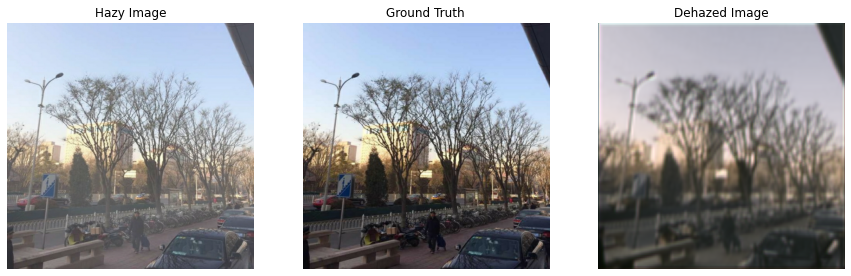

  -  Validation Loss: 0.0114  -   Time taken: 38.04s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 4 [==]  -  Training Loss: 0.0118

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


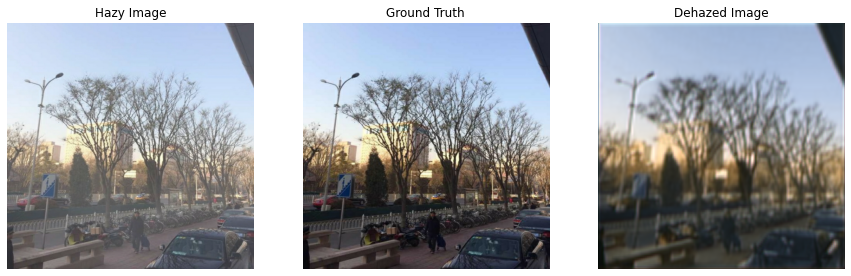

  -  Validation Loss: 0.0099  -   Time taken: 38.11s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 5 [==]  -  Training Loss: 0.0100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


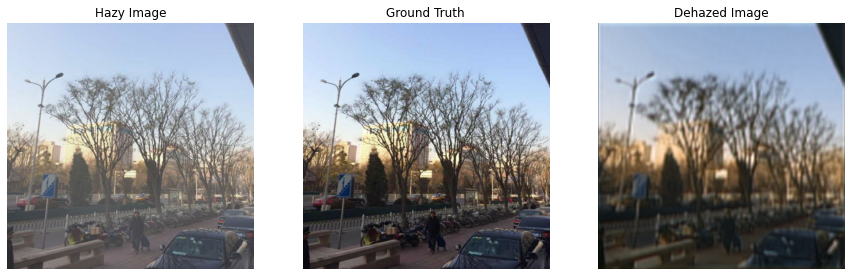

  -  Validation Loss: 0.0111  -   Time taken: 38.07s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 6 [==]  -  Training Loss: 0.0090

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


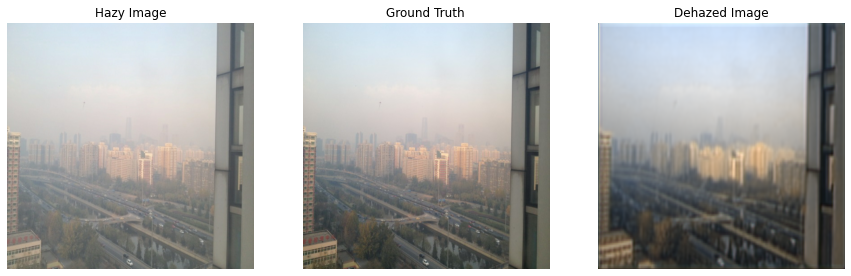

  -  Validation Loss: 0.0082  -   Time taken: 37.97s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 7 [==]  -  Training Loss: 0.0087

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


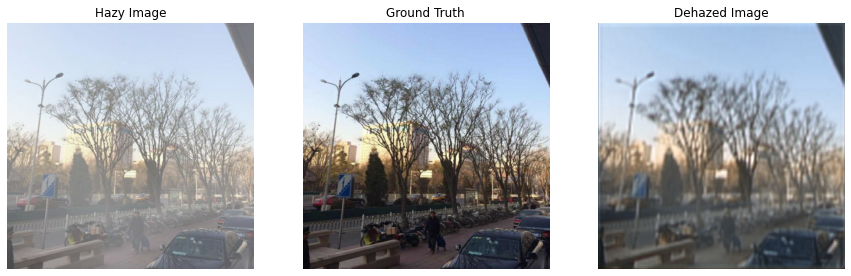

  -  Validation Loss: 0.0099  -   Time taken: 38.07s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 8 [==]  -  Training Loss: 0.0084

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


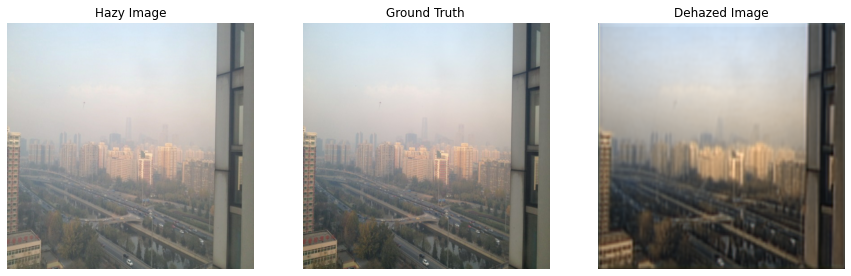

  -  Validation Loss: 0.0097  -   Time taken: 38.46s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 9 [==]  -  Training Loss: 0.0084

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


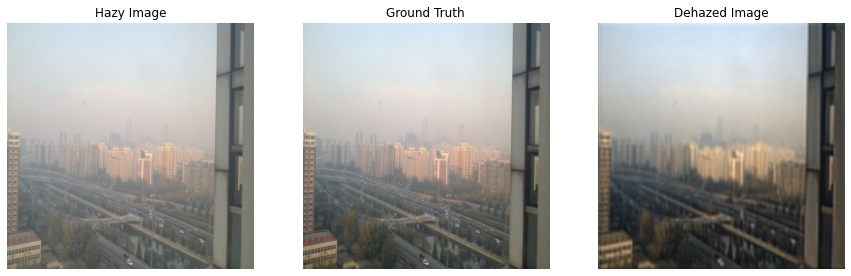

  -  Validation Loss: 0.0079  -   Time taken: 38.48s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 10 [==]  -  Training Loss: 0.0080

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


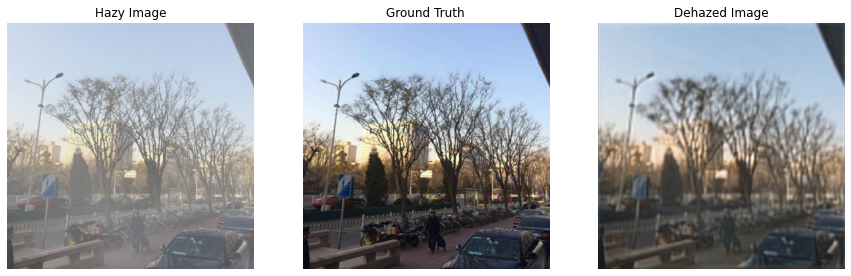

  -  Validation Loss: 0.0085  -   Time taken: 38.14s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 11 [==]  -  Training Loss: 0.0084

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


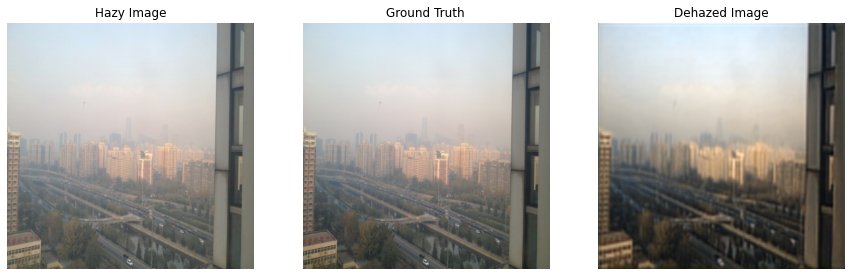

  -  Validation Loss: 0.0079  -   Time taken: 38.34s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 12 [==]  -  Training Loss: 0.0079

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


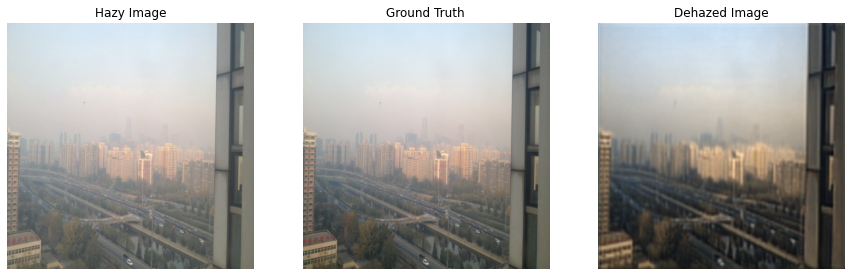

  -  Validation Loss: 0.0102  -   Time taken: 38.23s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 13 [==]  -  Training Loss: 0.0078

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


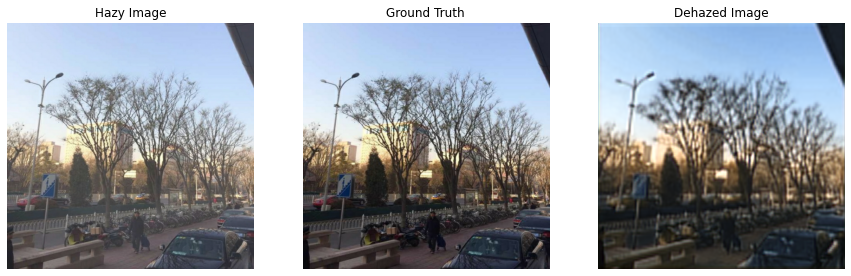

  -  Validation Loss: 0.0091  -   Time taken: 38.40s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 14 [==]  -  Training Loss: 0.0077

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


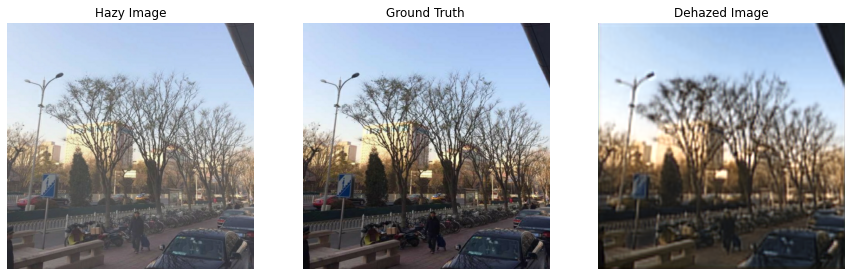

  -  Validation Loss: 0.0081  -   Time taken: 38.43s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 15 [==]  -  Training Loss: 0.0080

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


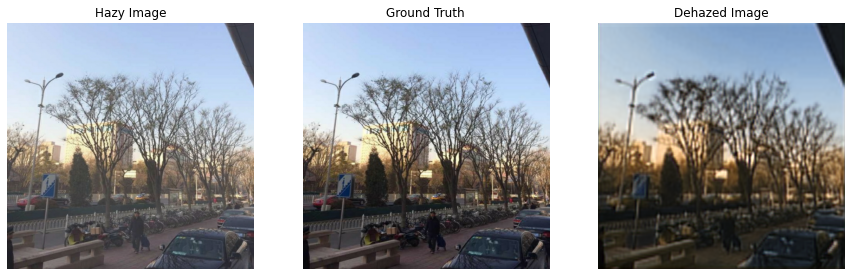

  -  Validation Loss: 0.0158  -   Time taken: 38.57s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 16 [==]  -  Training Loss: 0.0080

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


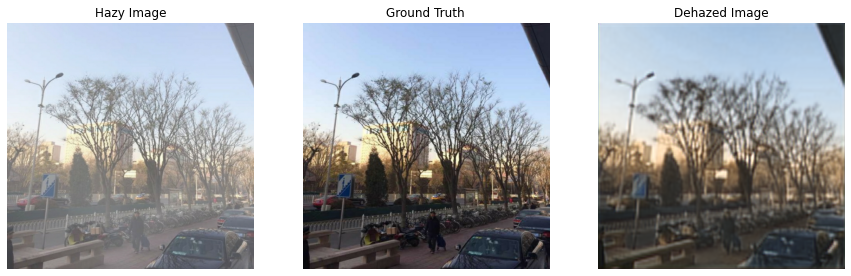

  -  Validation Loss: 0.0114  -   Time taken: 38.65s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 17 [==]  -  Training Loss: 0.0075

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


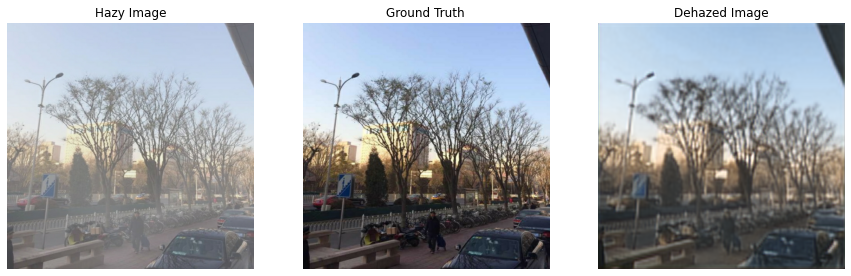

  -  Validation Loss: 0.0077  -   Time taken: 38.43s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 18 [==]  -  Training Loss: 0.0076

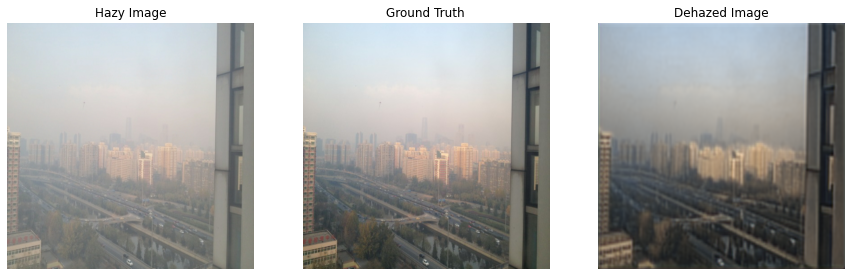

  -  Validation Loss: 0.0126  -   Time taken: 38.41s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 19 [==]  -  Training Loss: 0.0074

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


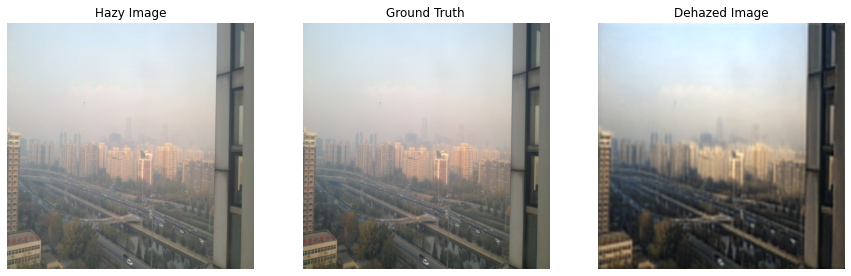

  -  Validation Loss: 0.0078  -   Time taken: 38.76s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 20 [==]  -  Training Loss: 0.0075

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


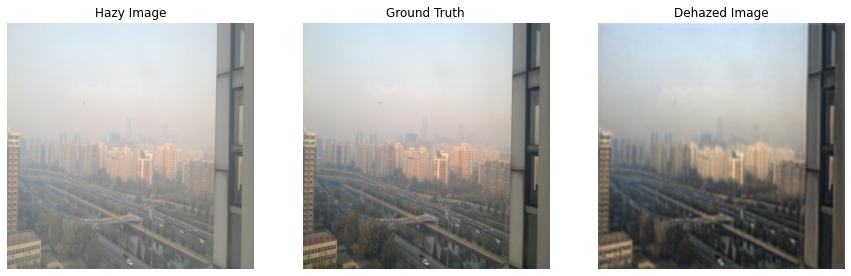

  -  Validation Loss: 0.0113  -   Time taken: 38.34s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 21 [==]  -  Training Loss: 0.0074

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


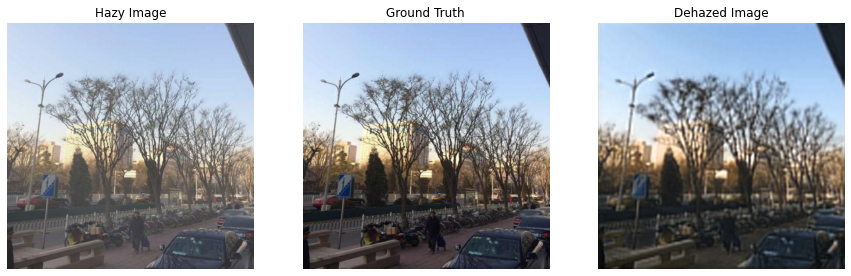

  -  Validation Loss: 0.0081  -   Time taken: 38.40s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 22 [==]  -  Training Loss: 0.0075

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


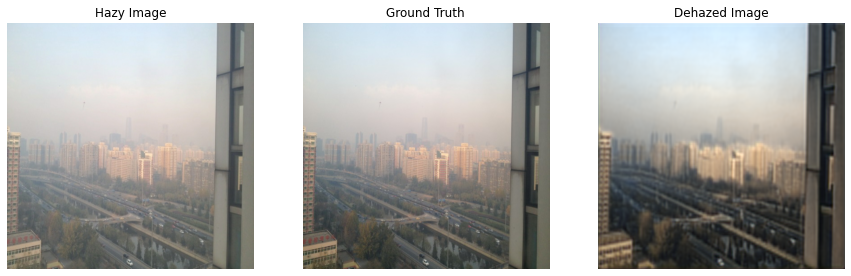

  -  Validation Loss: 0.0083  -   Time taken: 38.24s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 23 [==]  -  Training Loss: 0.0076

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


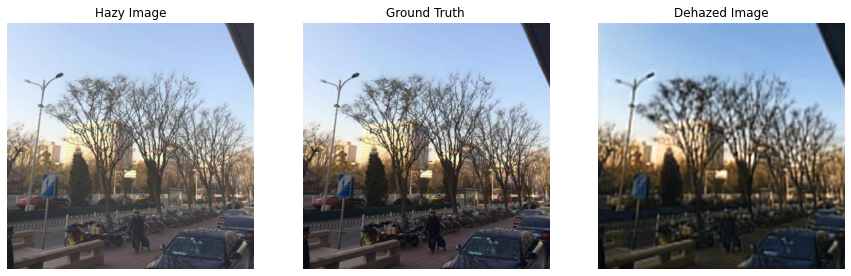

  -  Validation Loss: 0.0113  -   Time taken: 38.57s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 24 [==]  -  Training Loss: 0.0073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


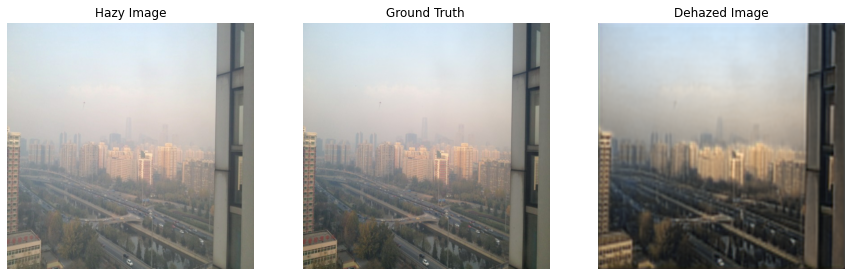

  -  Validation Loss: 0.0110  -   Time taken: 38.56s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 25 [==]  -  Training Loss: 0.0073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


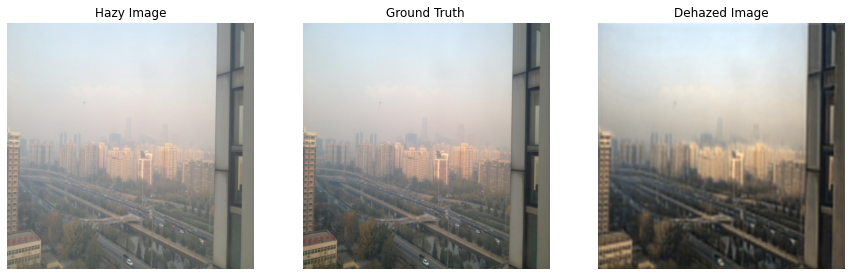

  -  Validation Loss: 0.0082  -   Time taken: 38.50s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 26 [==]  -  Training Loss: 0.0075

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


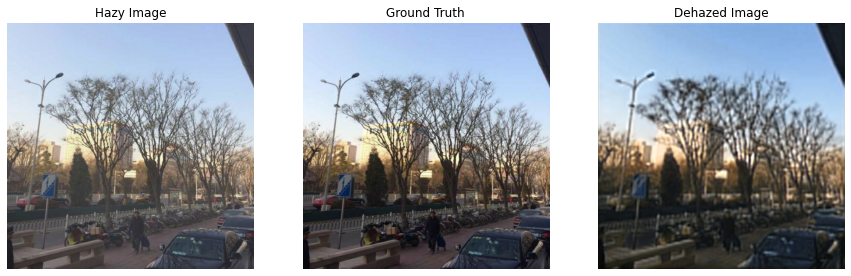

  -  Validation Loss: 0.0083  -   Time taken: 38.46s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 27 [==]  -  Training Loss: 0.0071

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


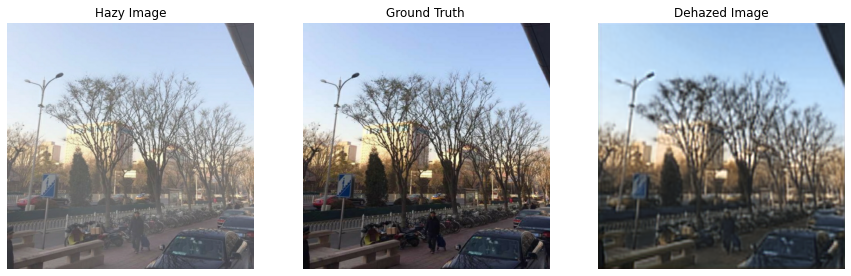

  -  Validation Loss: 0.0108  -   Time taken: 38.49s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 28 [==]  -  Training Loss: 0.0072

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


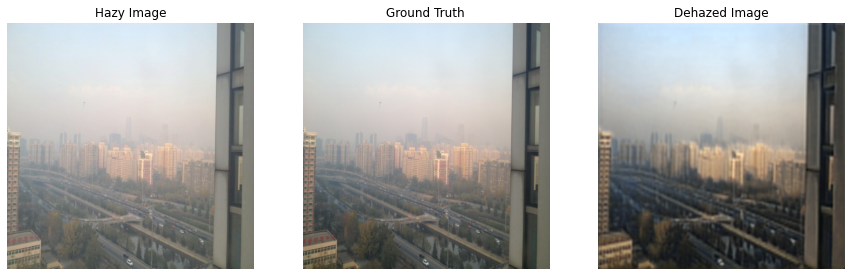

  -  Validation Loss: 0.0094  -   Time taken: 38.29s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 29 [==]  -  Training Loss: 0.0073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


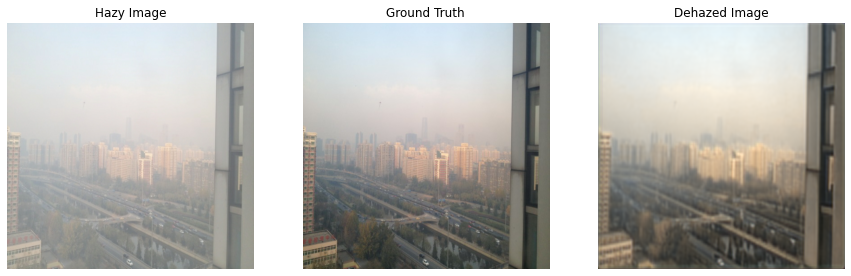

  -  Validation Loss: 0.0093  -   Time taken: 38.49s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 30 [==]  -  Training Loss: 0.0075

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


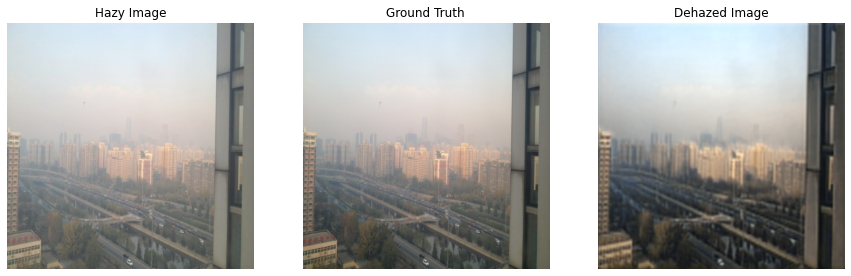

  -  Validation Loss: 0.0076  -   Time taken: 38.18s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 31 [==]  -  Training Loss: 0.0072

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


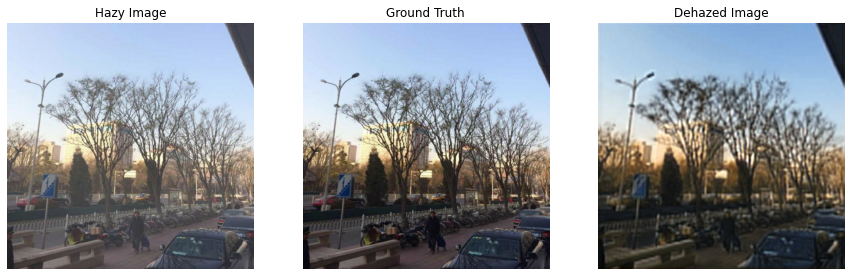

  -  Validation Loss: 0.0132  -   Time taken: 38.49s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 32 [==]  -  Training Loss: 0.0071

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


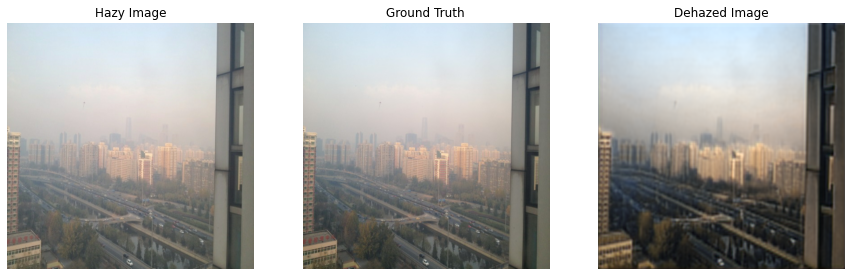

  -  Validation Loss: 0.0083  -   Time taken: 38.25s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 33 [==]  -  Training Loss: 0.0071

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


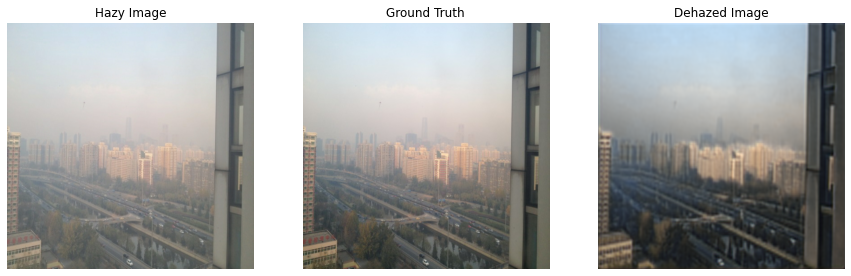

  -  Validation Loss: 0.0096  -   Time taken: 38.30s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 34 [==]  -  Training Loss: 0.0070

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


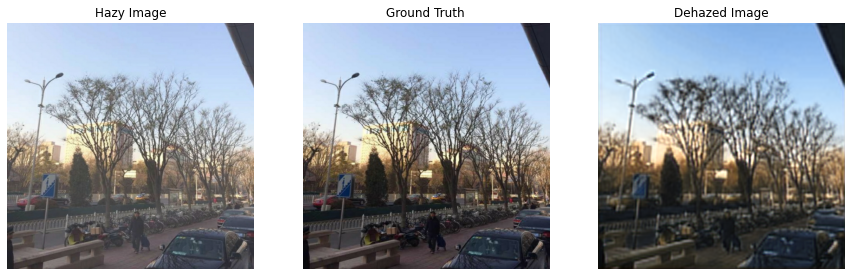

  -  Validation Loss: 0.0099  -   Time taken: 38.56s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 35 [==]  -  Training Loss: 0.0071

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


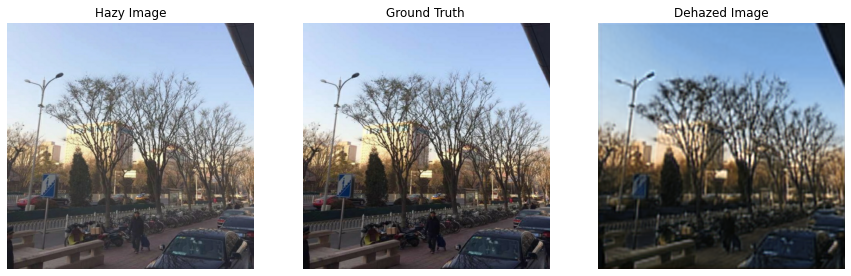

  -  Validation Loss: 0.0152  -   Time taken: 38.29s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 36 [==]  -  Training Loss: 0.0073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


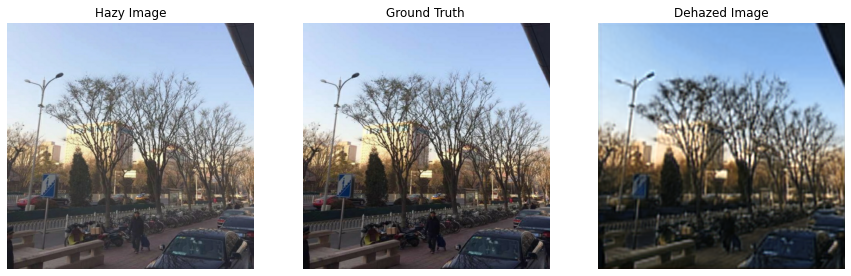

  -  Validation Loss: 0.0099  -   Time taken: 38.34s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 37 [==]  -  Training Loss: 0.0070

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


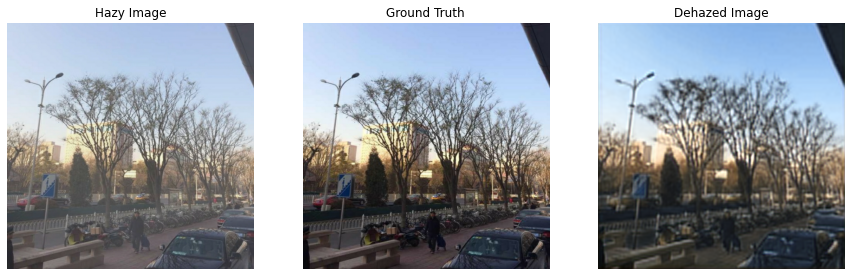

  -  Validation Loss: 0.0076  -   Time taken: 38.23s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 38 [==]  -  Training Loss: 0.0069

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


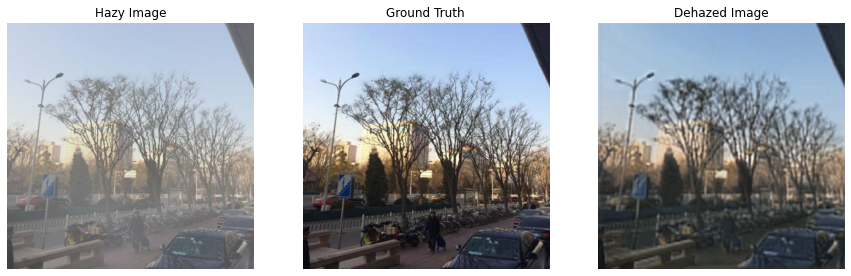

  -  Validation Loss: 0.0125  -   Time taken: 38.32s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 39 [==]  -  Training Loss: 0.0068

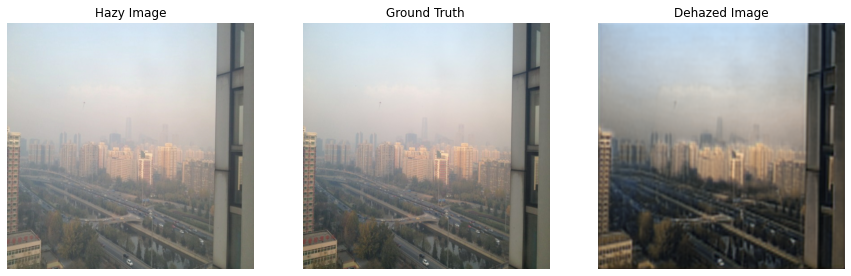

  -  Validation Loss: 0.0118  -   Time taken: 38.76s
INFO:tensorflow:Assets written to: trained_model/assets
CPU times: user 16min 21s, sys: 2min 13s, total: 18min 35s
Wall time: 26min 14s


In [28]:
%%time
train_model(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer)

In [ ]:
def evaluate(net, test_img_path):
    
    test_img = glob.glob(test_img_path + '/*.jpg')
    random.shuffle(test_img)
    
    for img in test_img:
        
        img = tf.io.read_file(img)
        img = tf.io.decode_jpeg(img, channels = 3)
        
        if img.shape[1] > img.shape[0]:
            img = tf.image.resize(img, size = (1080, 1920), antialias = True)
        if img.shape[1] < img.shape[0]:
            img = tf.image.resize(img, size = (1920, 1080), antialias = True)
        
        img = img / 255.0
        img = tf.expand_dims(img, axis = 0)      #transform input image from 3D to 4D ###
        
        dehaze = net(img, training = False)
        
        plt.figure(figsize = (80, 80))
        
        display_list = [img[0], dehaze[0]]       #make the first dimension zero
        title = ['Hazy Image', 'Dehazed Image']

        for i in range(2):
            plt.subplot(1, 2, i+1)
            plt.title(title[i], fontsize = 65, y = 1.045)
            plt.imshow(display_list[i])
            plt.axis('off')
        
        plt.show()

In [ ]:
test_net = tf.keras.models.load_model('trained_model', compile = False)
evaluate(test_net, '../input/hazy-test-images')